<a href="https://colab.research.google.com/github/DGkurnia/discuss1/blob/main/aqianalysis_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Proyek Analisis Data: [Air Quality Dataset]
- **Nama:** [Derfansyah Guswiranata Kurnia]
- **Email:** [weerakurnia@gmail.com]
- **ID Dicoding:** [dgkurnia]
- **ID Domisili:** [dgkurnia]

## Menentukan Pertanyaan Bisnis

- Question 1: What were the temperature conditions in twelve cities from 2013 to 2017?
- Question 2: How was the particulate matter (PM 2.5 and PM 10) measured in - twelve cities from 2013 to 2017?
- Question 3: What were the levels of sulfur dioxide (SO2), nitrogen monoxide (NO), and carbon monoxide (CO) in twelve cities from 2013 to 2017?
- Question 4: How was the condition of ozone gas monitored from 2013 to 2017?

## Import Semua Packages/Library yang Digunakan

### Perpustaan utama

In [1]:
from google.colab import drive
drive.mount('/content/drive') #dasar instalasi file dari Google Drive

Mounted at /content/drive


### Tahap Selanjutnya

In [2]:
#perpustakaan untuk pembersihan
import numpy as np
import pandas as pd #dasar pengelolaan data
import matplotlib.pyplot as plt
import seaborn as sns
#peringatana
import warnings
warnings.filterwarnings('ignore')
#data lain

In [3]:
#data lain
from datetime import datetime # dasar pengelolaan data berbasis waktu
from scipy.interpolate import interp1d #interpolasi linear
from scipy.stats import skew #pemeriksaan kecendrungan dari histogram
import plotly.express as px #kecendrungan dari plot kotak

## Data Wrangling
Total data untuk analisis adalah 12 unit

### Gathering Data

In [4]:
#persiapan insersi data
dfaotizhongxin = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/aotizhongxin.csv')
dfchangping = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/changping.csv')
dfdingling = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/dingling.csv')
dfdongsi = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/dongsi.csv')
dfguanyuan = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/guanyuan.csv')
dfgucheng = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/gucheng.csv')
dfhuairou = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/huairo.csv')
dfnonzhanguan = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/nonzhanguan.csv')
dfshunyi = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/shunyi.csv')
dftiantan = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/tiantan.csv')
dfwanliu = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/wanliu.csv')
dfwanshouxigong = pd.read_csv('/content/drive/MyDrive/csv-files/aqins/wanshouxigong.csv')

In [5]:
#cek kolom untuk data hilang
dfchangping.columns

Index(['No', 'year', 'month', 'day', 'hour', 'PM2.5', 'PM10', 'SO2', 'NO2',
       'CO', 'O3', 'TEMP', 'PRES', 'DEWP', 'RAIN', 'wd', 'WSPM', 'station'],
      dtype='object')

**Insight:**
- There are 10 missing values in column
- There are only six clean columns

In [6]:
#inspeksi data hilang (Aotizhongxin)
dfaotizhongxin.isnull().sum()
dfchangping

,No,year,month,day,hour,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,1,2013,3,1,0,3.0,6.0,13.0,7.0,300.0,85.0,-2.3,1020.8,-19.7,0.0,E,0.5,Changping
1,2,2013,3,1,1,3.0,3.0,6.0,6.0,300.0,85.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Changping
2,3,2013,3,1,2,3.0,3.0,22.0,13.0,400.0,74.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Changping
3,4,2013,3,1,3,3.0,6.0,12.0,8.0,300.0,81.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Changping
4,5,2013,3,1,4,3.0,3.0,14.0,8.0,300.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Changping
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35059,35060,2017,2,28,19,28.0,47.0,4.0,14.0,300.0,NaN,11.7,1008.9,-13.3,0.0,NNE,1.3,Changping
35060,35061,2017,2,28,20,12.0,12.0,3.0,23.0,500.0,64.0,10.9,1009.0,-14.0,0.0,N,2.1,Changping
35061,35062,2017,2,28,21,7.0,23.0,5.0,17.0,500.0,68.0,9.5,1009.4,-13.0,0.0,N,1.5,Changping
35062,35063,2017,2,28,22,11.0,20.0,3.0,15.0,500.0,72.0,7.8,1009.6,-12.6,0.0,NW,1.4,Changping


### Assessing Data

In [7]:
#data information
dfaotizhongxin.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   No       35064 non-null  int64  
 1   year     35064 non-null  int64  
 2   month    35064 non-null  int64  
 3   day      35064 non-null  int64  
 4   hour     35064 non-null  int64  
 5   PM2.5    34139 non-null  float64
 6   PM10     34346 non-null  float64
 7   SO2      34129 non-null  float64
 8   NO2      34041 non-null  float64
 9   CO       33288 non-null  float64
 10  O3       33345 non-null  float64
 11  TEMP     35044 non-null  float64
 12  PRES     35044 non-null  float64
 13  DEWP     35044 non-null  float64
 14  RAIN     35044 non-null  float64
 15  wd       34983 non-null  object 
 16  WSPM     35050 non-null  float64
 17  station  35064 non-null  object 
dtypes: float64(11), int64(5), object(2)
memory usage: 4.8+ MB


In [8]:
#other cities
dfchangping['SO2'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 35064 entries, 0 to 35063
Series name: SO2
Non-Null Count  Dtype  
--------------  -----  
34436 non-null  float64
dtypes: float64(1)
memory usage: 274.1 KB


In [9]:
#Rain meter indication
dfaotizhongxin['RAIN'].describe()

,RAIN
count,35044.000000
mean,0.067421
std,0.910056
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,72.500000


### **Insight:**
- No: Index
- Year, month, day, and hour refer to individial time index
- PM2.5 and PM10 are particulate size in microgram per meter cubic
- SO2, NO2, CO, O3 are particulate concentration in (microgram/meter cubic)
- TEMP, PRES, DEWP are physical indicator for temprature and dewpressure/moisture index (in celsius), pressure (in Hectopascal)
- RAIN is the rain indicator speed (in mm)

### Cleaning Data
#### The suitable method for cleaning dataset is interpolation
- merging year, month, hour, and day into one timeframe
- two-step interpolation inother columns

In [10]:
#initial cleaning (creating copy to secure original data)
dfaotizc = dfaotizhongxin.copy()
dfchangpc = dfchangping.copy()
dfdinglc = dfdingling.copy()
dfdongsc = dfdongsi.copy()
dfguanc = dfguanyuan.copy()
dfguchgc = dfgucheng.copy()
dfhuairc = dfhuairou.copy()
dfnonzhgc = dfnonzhanguan.copy()
dfshunyc = dfshunyi.copy()
dftiantc = dftiantan.copy()
dfwanlic = dfwanliu.copy()
dfwansxc = dfwanshouxigong.copy()
#to merging phase

In [11]:
#merging three columns into one timeframe before clearing
dfaotizc['datetime'] = pd.to_datetime(dfaotizc[['year', 'month', 'day', 'hour']]) #Aotizhongxin
dfchangpc['datetime'] = pd.to_datetime(dfchangpc[['year', 'month', 'day', 'hour']]) #Changping
dfdinglc['datetime'] = pd.to_datetime(dfdinglc[['year', 'month', 'day', 'hour']]) #Dingling
dfdongsc['datetime'] = pd.to_datetime(dfdongsc[['year', 'month', 'day', 'hour']]) #Dongsi
dfguanc['datetime'] = pd.to_datetime(dfguanc[['year', 'month', 'day', 'hour']]) #Guanyuan
dfguchgc['datetime'] = pd.to_datetime(dfguchgc[['year', 'month', 'day', 'hour']]) #Gucheng
dfhuairc['datetime'] = pd.to_datetime(dfhuairc[['year', 'month', 'day', 'hour']]) #Huiro/Huairou
dfnonzhgc['datetime'] = pd.to_datetime(dfnonzhgc[['year', 'month', 'day', 'hour']]) #Nonzhanguan
dfshunyc['datetime'] = pd.to_datetime(dfshunyc[['year', 'month', 'day', 'hour']]) #Shunyi
dftiantc['datetime'] = pd.to_datetime(dftiantc[['year', 'month', 'day', 'hour']]) #Tiantan
dfwanlic['datetime'] = pd.to_datetime(dfwanlic[['year', 'month', 'day', 'hour']]) #Wanliu
dfwansxc['datetime'] = pd.to_datetime(dfwansxc[['year', 'month', 'day', 'hour']]) #Wanshouxigong
#to removing useless columns

In [12]:
#clearing three unneccesary columns
dfaotizc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Aotizhongxin
dfchangpc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Changping
dfdinglc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Dingling
dfdongsc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Dongsi
dfguanc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Guanyuan
dfguchgc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Gucheng
dfhuairc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Huiro/Huairou
dfnonzhgc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Nonzhanguan
dfshunyc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Shunyi
dftiantc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Tiantan
dfwanlic.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Wanliu
dfwansxc.drop(['No', 'year', 'month', 'day', 'hour'], axis=1, inplace=True) #Wanshouxigong
#to interpolation

**Insight in date time:**
- the hour. day, month, and year are one unit
- starting year 2013 ending year 2017

In [13]:
#inspecting dataset after clearing (Aotizhongxing as sample)
dfaotizc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype         
---  ------    --------------  -----         
 0   PM2.5     34139 non-null  float64       
 1   PM10      34346 non-null  float64       
 2   SO2       34129 non-null  float64       
 3   NO2       34041 non-null  float64       
 4   CO        33288 non-null  float64       
 5   O3        33345 non-null  float64       
 6   TEMP      35044 non-null  float64       
 7   PRES      35044 non-null  float64       
 8   DEWP      35044 non-null  float64       
 9   RAIN      35044 non-null  float64       
 10  wd        34983 non-null  object        
 11  WSPM      35050 non-null  float64       
 12  station   35064 non-null  object        
 13  datetime  35064 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(11), object(2)
memory usage: 3.7+ MB


#### Interpolation phase (first)

In [14]:
#first interpolation (nearest)
dfaotizc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfaotizc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Aotizhongxin
dfchangpc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfchangpc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Changping
dfdinglc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfdinglc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Dingling
dfdongsc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfdongsc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Dongsi
dfguanc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfguanc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Guanyuan
dfhuairc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfhuairc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Huairou/Huairo
dfnonzhgc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfnonzhgc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Nonzhanguan
dfshunyc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfshunyc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Shunyi
dftiantc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dftiantc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Tiantan
dfwanlic[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfwanlic[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Wanliu
dfwansxc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfwansxc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='nearest') #Wanshouxigong

#to second interpolation

In [15]:
#second interpolation
#first interpolation (nearest)
dfaotizc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfaotizc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Aotizhongxin
dfchangpc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfchangpc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Changping
dfdinglc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfdinglc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Dingling
dfdongsc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfdongsc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Dongsi
dfguanc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfguanc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Guanyuan
dfhuairc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfhuairc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Huairou/Huairo
dfnonzhgc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfnonzhgc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Nonzhanguan
dfshunyc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfshunyc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Shunyi
dftiantc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dftiantc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Tiantan
dfwanlic[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfwanlic[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Wanliu
dfwansxc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']] = dfwansxc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].interpolate(method='linear') #Wanshouxigong

#to filing winddirection


In [16]:
#inspection after interpolaiton
dfaotizc[['PM2.5','PM10','SO2','NO2','CO','O3','TEMP','PRES','DEWP','RAIN','WSPM']].describe()

,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000,35064.000000
mean,82.566687,110.217114,17.466855,59.080639,1265.040326,55.341528,13.581421,1011.851659,3.120243,0.067383,1.708547
std,82.202876,95.404302,22.760778,37.121936,1243.684679,57.431374,11.400453,10.404574,13.690379,0.909798,1.204200
min,3.000000,2.000000,0.285600,2.000000,100.000000,0.214200,-16.800000,985.900000,-35.300000,0.000000,0.000000
25%,22.000000,38.000000,3.000000,30.000000,500.000000,7.000000,3.100000,1003.300000,-8.100000,0.000000,0.900000
50%,59.000000,87.000000,9.000000,54.000000,900.000000,41.000000,14.500000,1011.400000,3.800000,0.000000,1.400000
75%,114.000000,156.000000,22.000000,81.000000,1600.000000,81.000000,23.300000,1020.100000,15.600000,0.000000,2.200000
max,898.000000,984.000000,341.000000,290.000000,10000.000000,423.000000,40.500000,1042.000000,28.500000,72.500000,11.200000


In [17]:
#filling wind direction
dfaotizc['wd'] = dfaotizc['wd'].fillna('Unspecified') #Aotizhongxin
dfchangpc['wd'] = dfchangpc['wd'].fillna('Unspecified') #Changping
dfdinglc['wd'] = dfdinglc['wd'].fillna('Unspecified') #Dingling
dfdongsc['wd'] = dfdongsc['wd'].fillna('Unspecified') #Dongsi
dfguanc['wd'] = dfguanc['wd'].fillna('Unspecified') #Guanyuan
dfguchgc['wd'] = dfguchgc['wd'].fillna('Unspecified') #Gucheng
dfhuairc['wd'] = dfhuairc['wd'].fillna('Unspecified') #Huairou/Huairo
dfnonzhgc['wd'] = dfnonzhgc['wd'].fillna('Unspecified') #Nonzhanguan
dfshunyc['wd'] = dfshunyc['wd'].fillna('Unspecified') #Shunyi
dftiantc['wd'] = dftiantc['wd'].fillna('Unspecified') #Tiantan
dfwanlic['wd'] = dfwanlic['wd'].fillna('Unspecified') #Wanliu
dfwansxc['wd'] = dfwansxc['wd'].fillna('Unspecified') #Wanshouxigong

In [18]:
#inspecting wind direction
dfchangpc['wd'].describe()

,wd
count,35064
unique,17
top,NNW
freq,4776


**Insight:**
- In numerical description, rain indicator may be ignored due to its low occurence
- The other unique analysis is the diversive analysis of temprature, pressure and humidity (in number)

## Exploratory Data Analysis (EDA)

In [19]:
#preparing the dataset by merging them all for easire analysis
dfbeijing = pd.concat([dfaotizc, dfchangpc, dfdinglc, dfdongsc, dfguanc, dfguchgc, dfhuairc, dfnonzhgc, dfshunyc, dftiantc, dfwanlic, dfwansxc], ignore_index=True)
dfbeijc = dfbeijing.copy()
dfbeijing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 420768 entries, 0 to 420767
Data columns (total 14 columns):
 #   Column    Non-Null Count   Dtype         
---  ------    --------------   -----         
 0   PM2.5     420122 non-null  float64       
 1   PM10      420387 non-null  float64       
 2   SO2       420261 non-null  float64       
 3   NO2       420098 non-null  float64       
 4   CO        419367 non-null  float64       
 5   O3        420039 non-null  float64       
 6   TEMP      420717 non-null  float64       
 7   PRES      420718 non-null  float64       
 8   DEWP      420717 non-null  float64       
 9   RAIN      420725 non-null  float64       
 10  wd        420768 non-null  object        
 11  WSPM      420726 non-null  float64       
 12  station   420768 non-null  object        
 13  datetime  420768 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(11), object(2)
memory usage: 44.9+ MB


All dataset are cities in Beijing

### Exploring essential information

In [20]:
#station variety
indicator = dfbeijc['station'].unique().copy()

**Insight: General**
- There are more than 420 thousand rows and 12 columns
- Easier filtering with 'indicator' is needed

#### Perticulate Inspection

In [30]:
#Standar inspection (Particulate)
[anPMa, dlPMa, anPMb, dlPMb] = [40, 150, 35, 75]
#separating based on condition
bataspar = {'PM2.5 anual': anPMa,'PM2.5 maksimal': dlPMa,
    'PM10 anual': anPMb,'PM10 maksimal': dlPMb}
#to compound analysis

In [22]:
#standar compound inspection (Safety Declaration)
[cochl, cogl, ozmin, ozmax, nmax, smax ] = [4000, 30000, 50, 160, 200, 500]
#sulphur and nitrogen limits
[noanl, nohl, sohl, sodl, smax] = [40, nmax, 350, 125, smax]
#rewriting the description
colim = { 'China' : cochl, 'Global' : cogl} #CO limit
ozlim = { 'minimum' : ozmin,'maximum' : ozmax } #Inspeksi Ozon/ ozon (O3)
nitlim = {'anual': noanl, 'maksimal' : nmax} #Limits in nitrogen dioksida (NO2)
sulplim = {'daily': sodl, 'hourly': sohl, 'maksimal': smax} #Batas Sulfur dioksida (SO2)
#to physical aspects

In [80]:
#physical aspects
#temprature
[nolim, diglim, nrmlim, pnslim] = [0, 10, 25, 35]
#pressure
atm = 1013.25
#moisture
[drl, comdr, humin] = [10, 15, 20]
#windspeed
[lwlsp, mwl, stglim, ghig] = [1.5, 3, 3.2, 5]
#rainspeed
[drl, lrl, mdl, hvrl] = [0.1, 2.5, 2.6, 7.6]
#rewriting temprature
btsuhu = {'nol' : nolim,'dingin': diglim,'normal': nrmlim, 'panas': pnslim}
#humidity limit
btlembap = {'kering': drl, 'biasa': comdr, 'lembap': humin}


In [24]:
#datetime analysis (initial)
dfbeijc['date'] = dfbeijc['datetime'].dt.date.copy()

In [129]:
#particulate inspection
parres = dfbeijc.groupby(['station','date']).agg({
    "datetime": "nunique",  # station
    "PM2.5": "mean",   # mean value of 'PM2.5'
    "PM10": "mean"     # mean value of 'PM10'
}).reset_index().copy()
# Renaming columns
parres.columns = ['station','date','numerical hour', 'PM2.5 value', 'PM10 value']
parres['date'] = pd.to_datetime(parres['date'])
arres.info()

NameError: name 'arres' is not defined

**Inspecting Particulate inspection**
- The Station-based inspection marks the highest average PM10 value in Gucheng while thr highest PM2.5 value is in Wanshouxigong (in alltime station average)
- The daily-station marks how high the average particulate inspection in hour 24

In [27]:
#daily inspection of chemical ompound
compres = dfbeijc.groupby(['station','date']).agg({
    "datetime": "nunique",  # station
    "CO": "mean",   # mean value of 'CO'
    "O3": "mean",     # mean value of 'O3'
    "NO2": "mean",     # mean value of 'NO2'
    "SO2": "mean"     # mean value of 'SO2'
}).reset_index().copy()
compres.columns = ['station','date','numerical hour', 'CO value', 'O3 value', 'NO2 value', 'SO2 value']
compres['date'] = pd.to_datetime(compres['date'])
lowestcom = compres[['station','CO value','O3 value','NO2 value','SO2 value']].min()
highestcom = compres[['station','CO value','O3 value','NO2 value','SO2 value']].max()
compres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17532 entries, 0 to 17531
Data columns (total 7 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   station         17532 non-null  object        
 1   date            17532 non-null  datetime64[ns]
 2   numerical hour  17532 non-null  int64         
 3   CO value        17508 non-null  float64       
 4   O3 value        17522 non-null  float64       
 5   NO2 value       17529 non-null  float64       
 6   SO2 value       17529 non-null  float64       
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 958.9+ KB


In [28]:
#physical aspects analysis
physres = dfbeijc.groupby(['station','date']).agg({
    "datetime": "nunique",  # station
    "TEMP": "mean",   # mean value of temprature
    "PRES": "mean",     # mean value of pressure
    "DEWP": "mean",     # mean value of dewpoint value/humidity
    "RAIN": "mean",     # mean value of rainfall indicator
    "WSPM": "mean"     # mean value of wind speed
}).reset_index().copy()
physres.columns = ['station','date','numerical hour', 'TEMP value', 'PRES value', 'DEWP value', 'RAIN value', 'WSPM value']
physres['date'] = pd.to_datetime(physres['date'])
lowestphys = physres[['station','TEMP value','PRES value','DEWP value','RAIN value','WSPM value']].min()
highestphys = physres[['station','TEMP value','PRES value','DEWP value','RAIN value','WSPM value']].max()
physres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17532 entries, 0 to 17531
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   station         17532 non-null  object        
 1   date            17532 non-null  datetime64[ns]
 2   numerical hour  17532 non-null  int64         
 3   TEMP value      17532 non-null  float64       
 4   PRES value      17532 non-null  float64       
 5   DEWP value      17532 non-null  float64       
 6   RAIN value      17532 non-null  float64       
 7   WSPM value      17532 non-null  float64       
dtypes: datetime64[ns](1), float64(5), int64(1), object(1)
memory usage: 1.1+ MB


In [82]:
#preparing the daily dataframe (inspecting daily merging three results)
esscomp = compres.iloc[:,3:].copy()
essphys = physres.iloc[:,3:].copy()
#merging the dataset
dailydf = pd.concat([parres, esscomp, essphys], axis=1)
dailydfc = dailydf.copy()


In [83]:
#rechecking the value
dailydfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17532 entries, 0 to 17531
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   station         17532 non-null  object        
 1   date            17532 non-null  datetime64[ns]
 2   numerical hour  17532 non-null  int64         
 3   PM2.5 value     17531 non-null  float64       
 4   PM10 value      17532 non-null  float64       
 5   CO value        17508 non-null  float64       
 6   O3 value        17522 non-null  float64       
 7   NO2 value       17529 non-null  float64       
 8   SO2 value       17529 non-null  float64       
 9   TEMP value      17532 non-null  float64       
 10  PRES value      17532 non-null  float64       
 11  DEWP value      17532 non-null  float64       
 12  RAIN value      17532 non-null  float64       
 13  WSPM value      17532 non-null  float64       
dtypes: datetime64[ns](1), float64(11), int64(1), object(1)

In [64]:
#Recleaning the missing value
dailydfc[['PM2.5 value','CO value','O3 value','NO2 value','SO2 value']] = dailydfc[['PM2.5 value','CO value',
                                                                                  'O3 value','NO2 value','SO2 value']].fillna(dailydfc[['PM2.5 value','CO value','O3 value','NO2 value','SO2 value']].median())

In [65]:
#station indicator
stindica = dfbeijc['station'].unique().copy() #Indicator

In [66]:
#Inspecting exceedance in particulate inspection
parinfo = {}
for station in stindica:
    # Filter data for the current station
    data_station = dailydfc[dailydfc['station'] == station]

    # Check if the filtered data contains necessary columns
    if 'PM2.5 value' in data_station.columns and 'PM10 value' in data_station.columns:
        # Calculate counts for PM2.5
        anuapma = ((data_station['PM2.5 value'] > bataspar['PM2.5 anual']) & (data_station['PM2.5 value'] <= bataspar['PM2.5 maksimal'])).sum()  # Above annual limit but below max (PM2.5)
        maxpma = (data_station['PM2.5 value'] >= bataspar['PM2.5 maksimal']).sum()  # Below or equal to max (PM2.5)

        # Calculate counts for PM10
        anuapmb = ((data_station['PM10 value'] > bataspar['PM10 anual']) & (data_station['PM10 value'] <= bataspar['PM10 maksimal'])).sum()  # Above annual limit but below max (PM10)
        maxpmb = (data_station['PM10 value'] >= bataspar['PM10 maksimal']).sum()  # Below or equal to max (PM10)

        # Store results in dictionary
        parinfo[station] = [anuapma, maxpma, anuapmb, maxpmb]

        # Print results for inspection
        print(f"Results for Station: {station}:")
        print(f"  PM2.5 - Annual Limit Exceeded: {anuapma}")
        print(f"  PM2.5 - Max Limit Compliance: {maxpma}")
        print(f"  PM10 - Annual Limit Exceeded: {anuapmb}")
        print(f"  PM10 - Max Limit Compliance: {maxpmb}")
    else:
        print(f"Data for Station {station} is missing required keys.")

    print("-" * 40)  # Separator for clarity

Results for Station: Aotizhongxin:
  PM2.5 - Annual Limit Exceeded: 816
  PM2.5 - Max Limit Compliance: 190
  PM10 - Annual Limit Exceeded: 391
  PM10 - Max Limit Compliance: 881
----------------------------------------
Results for Station: Changping:
  PM2.5 - Annual Limit Exceeded: 718
  PM2.5 - Max Limit Compliance: 149
  PM10 - Annual Limit Exceeded: 440
  PM10 - Max Limit Compliance: 772
----------------------------------------
Results for Station: Dingling:
  PM2.5 - Annual Limit Exceeded: 662
  PM2.5 - Max Limit Compliance: 140
  PM10 - Annual Limit Exceeded: 441
  PM10 - Max Limit Compliance: 653
----------------------------------------
Results for Station: Dongsi:
  PM2.5 - Annual Limit Exceeded: 809
  PM2.5 - Max Limit Compliance: 209
  PM10 - Annual Limit Exceeded: 384
  PM10 - Max Limit Compliance: 887
----------------------------------------
Results for Station: Guanyuan:
  PM2.5 - Annual Limit Exceeded: 823
  PM2.5 - Max Limit Compliance: 189
  PM10 - Annual Limit Exceede

In [69]:
#Daily exceddance in compound limits (CO)
coinfo = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    # Check if the filtered data contains necessary columns
    if 'CO value' in filtered.columns:
        # Calculate counts for CO
        chinexc = ((filtered['CO value'] > colim['China']) & (filtered['CO value'] <= colim['Global'])).sum()  # Above chinese limit but below g;obal (CO)
        glexc = (filtered['CO value'] >= colim['Global']).sum()  # Above or equal to Global level (CO)
        # Store results in dictionary
        coinfo[station] = [chinexc, glexc]
        # Print results for inspection
        print(f"Results for Station: {station}:")
        print(f"  China Limit Exceeded: {chinexc}")
        print(f"  Global Limit Exceeded: {glexc}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)  # Separator for clarity

Results for Station: Aotizhongxin:
  China Limit Exceeded: 46
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Changping:
  China Limit Exceeded: 25
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Dingling:
  China Limit Exceeded: 12
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Dongsi:
  China Limit Exceeded: 32
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Guanyuan:
  China Limit Exceeded: 37
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Gucheng:
  China Limit Exceeded: 49
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Huairou:
  China Limit Exceeded: 9
  Global Limit Exceeded: 0
----------------------------------------
Results for Station: Nongzhanguan:
  China Limit Exceeded: 50
  Global Limit Exceeded: 0
-----------------------------

In [70]:
#Daily Inspection in Ozone
ozinfo = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    # Check if the filtered data contains necessary columns
    if 'O3 value' in filtered.columns:
        # Calculate counts for Ozone
        minoz = (filtered['O3 value'] < ozlim['minimum']).sum()  # Below Minimal
        optimoz = ((filtered['O3 value'] >= ozlim['minimum']) & (filtered['O3 value'] <= ozlim['maximum'])).sum()  # Between minimum and maximum
        maxoz = (filtered['O3 value'] > ozlim['maximum']).sum()  # Above maximum
        # Store results in dictionary
        ozinfo[station] = [minoz, optimoz, maxoz]
        # Printing Results
        print(f"Results for Station: {station}:")
        print(f"  Minimum Ozone: {minoz}")
        print(f"  Optimal Ozone: {optimoz}")
        print(f"  Maximal Ozone: {maxoz}")
        print("-" * 40)  # Separator for clarity

Results for Station: Aotizhongxin:
  Minimum Ozone: 727
  Optimal Ozone: 721
  Maximal Ozone: 13
----------------------------------------
Results for Station: Changping:
  Minimum Ozone: 714
  Optimal Ozone: 734
  Maximal Ozone: 13
----------------------------------------
Results for Station: Dingling:
  Minimum Ozone: 493
  Optimal Ozone: 930
  Maximal Ozone: 38
----------------------------------------
Results for Station: Dongsi:
  Minimum Ozone: 698
  Optimal Ozone: 753
  Maximal Ozone: 10
----------------------------------------
Results for Station: Guanyuan:
  Minimum Ozone: 750
  Optimal Ozone: 703
  Maximal Ozone: 8
----------------------------------------
Results for Station: Gucheng:
  Minimum Ozone: 706
  Optimal Ozone: 750
  Maximal Ozone: 5
----------------------------------------
Results for Station: Huairou:
  Minimum Ozone: 689
  Optimal Ozone: 745
  Maximal Ozone: 27
----------------------------------------
Results for Station: Nongzhanguan:
  Minimum Ozone: 694
  Optim

In [73]:
#Daily Inspection in Nitrogen and Sulphur (Nitrogen dioxide and Sulphur Dioxide)
nitinfo = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    # Check if the filtered data contains necessary columns
    if 'NO2 value' in filtered.columns and 'SO2 value' in filtered.columns:
        # Calculate counts for Nitrogen
        anlim = ((filtered['NO2 value'] > nitlim['anual']) & (filtered['NO2 value'] <= nitlim['maksimal'])).sum()  # Above annual limit but below max (NO2)
        maxlim = (filtered['NO2 value'] >= nitlim['maksimal']).sum()  # Below or equal to max (NO2)
        # Calculate counts for Sulphur
        dailylim = ((filtered['SO2 value'] > sulplim['daily']) & (filtered['SO2 value'] <= sulplim['hourly'])).sum()  # Above daily limit but below hourly
        hourlylim = ((filtered['SO2 value'] > sulplim['hourly']) & (filtered['SO2 value'] <= sulplim['maksimal'])).sum()  # Above hourly limit but below max (SO2)
        maxlim = (filtered['SO2 value'] >= sulplim['maksimal']).sum()  # Below or equal to max (SO2)
        # Store results in dictionary
        nitinfo[station] = [anlim, maxlim, dailylim, hourlylim]
        # Results for Inspection
        print(f"Results for Station: {station}:")
        print(f"  Annual Limit Exceeded in Nitrogen Dioxide: {anlim}")
        print(f"  Max Limit Compliance in Nitrogen Dioxide: {maxlim}")
        print(f"  Daily Limit Exceeded in SO2 compound: {dailylim}")
        print(f"  Hourly Limit Exceeded in SO2 compound: {hourlylim}")
        print(f"  Total Limit Exceeded in SO2 compound: {maxlim}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)  # Separator for clarity

Results for Station: Aotizhongxin:
  Annual Limit Exceeded in Nitrogen Dioxide: 1075
  Max Limit Compliance in Nitrogen Dioxide: 0
  Daily Limit Exceeded in SO2 compound: 4
  Hourly Limit Exceeded in SO2 compound: 0
  Total Limit Exceeded in SO2 compound: 0
----------------------------------------
Results for Station: Changping:
  Annual Limit Exceeded in Nitrogen Dioxide: 652
  Max Limit Compliance in Nitrogen Dioxide: 0
  Daily Limit Exceeded in SO2 compound: 1
  Hourly Limit Exceeded in SO2 compound: 0
  Total Limit Exceeded in SO2 compound: 0
----------------------------------------
Results for Station: Dingling:
  Annual Limit Exceeded in Nitrogen Dioxide: 308
  Max Limit Compliance in Nitrogen Dioxide: 0
  Daily Limit Exceeded in SO2 compound: 0
  Hourly Limit Exceeded in SO2 compound: 0
  Total Limit Exceeded in SO2 compound: 0
----------------------------------------
Results for Station: Dongsi:
  Annual Limit Exceeded in Nitrogen Dioxide: 956
  Max Limit Compliance in Nitrogen

#### Physical Inspection

In [76]:
#Temprature Inspection
tempreport = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    #inspecting temperatur value
    if 'TEMP value' in filtered.columns:
        # Calculate counts for Temperature
        zero = (filtered['TEMP value'] < btsuhu['nol']).sum()  # Below 0
        cold = ((filtered['TEMP value'] >= btsuhu['nol']) & (filtered['TEMP value'] <= btsuhu['dingin'])).sum()  # Between 0 and maximal cold value
        normal = ((filtered['TEMP value'] > btsuhu['dingin']) & (filtered['TEMP value'] <= btsuhu['normal'])).sum()  # Between cold and normal value
        hot = ((filtered['TEMP value'] > btsuhu['normal']) & (filtered['TEMP value'] <= btsuhu['panas'])).sum()  # Between normal and hot value
        maxtemp = (filtered['TEMP value'] > btsuhu['panas']).sum()  # Above hot value
        # Store results in dictionary
        tempreport[station] = [zero, cold, normal, hot, maxtemp]
        # Printing Results
        print(f"Results for Station: {station}:")
        print(f"  Below 0: {zero}")
        print(f"  Cold: {cold}")
        print(f"  Normal: {normal}")
        print(f"  Hot: {hot}")
        print(f"  Maximal Temperature: {maxtemp}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)  # Separator for clarity

Results for Station: Aotizhongxin:
  Below 0: 210
  Cold: 379
  Normal: 588
  Hot: 284
  Maximal Temperature: 0
----------------------------------------
Results for Station: Changping:
  Below 0: 206
  Cold: 376
  Normal: 605
  Hot: 274
  Maximal Temperature: 0
----------------------------------------
Results for Station: Dingling:
  Below 0: 206
  Cold: 376
  Normal: 605
  Hot: 274
  Maximal Temperature: 0
----------------------------------------
Results for Station: Dongsi:
  Below 0: 215
  Cold: 369
  Normal: 580
  Hot: 297
  Maximal Temperature: 0
----------------------------------------
Results for Station: Guanyuan:
  Below 0: 210
  Cold: 379
  Normal: 588
  Hot: 284
  Maximal Temperature: 0
----------------------------------------
Results for Station: Gucheng:
  Below 0: 193
  Cold: 382
  Normal: 596
  Hot: 290
  Maximal Temperature: 0
----------------------------------------
Results for Station: Huairou:
  Below 0: 287
  Cold: 328
  Normal: 625
  Hot: 221
  Maximal Temperature:

In [77]:
#Pressure Inspection
presreport = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    #inspecting the existence of pressure ('PRES value')
    if 'PRES value' in filtered.columns:
        # Calculate counts for Pressure
        atm = (filtered['PRES value'] < atm).sum()  # Below atmospher
        high = (filtered['PRES value'] >= atm).sum()  # Above atmospher
        # Store results in dictionary
        presreport[station] = [atm, high]
        # Printing Results
        print(f"Results for Station: {station}:")
        print(f"  Below Atmospheric Pressure: {atm}")
        print(f"  Above Atmospheric Pressure: {high}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)

Results for Station: Aotizhongxin:
  Below Atmospheric Pressure: 804
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Changping:
  Below Atmospheric Pressure: 0
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Dingling:
  Below Atmospheric Pressure: 0
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Dongsi:
  Below Atmospheric Pressure: 0
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Guanyuan:
  Below Atmospheric Pressure: 0
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Gucheng:
  Below Atmospheric Pressure: 0
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Huairou:
  Below Atmospheric Pressure: 0
  Above Atmospheric Pressure: 1461
----------------------------------------
Results for Station: Non

In [79]:
#Humidity Inspection
humirep = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    #inspecting the existence of humidity ('DEWP value')
    if 'DEWP value' in filtered.columns:
      #Humidity Inspection
      desert = (filtered['DEWP value'] < btlembap['kering']).sum()  # Below dry
      common = ((filtered['DEWP value'] >= btlembap['kering']) & (filtered['DEWP value'] <= btlembap['biasa'])).sum()  # Between dry and common
      wet = ((filtered['DEWP value'] > btlembap['biasa']) & (filtered['DEWP value'] <= btlembap['lembap'])).sum()  # Between common and wet
      hihum = (filtered['DEWP value'] > btlembap['lembap']).sum()  # Above wet
      # Store results in dictionary
      humirep[station] = [desert, common, wet, hihum]
      # Printing Results
      print(f"Results for Station: {station}:")
      print(f"  Dry: {desert}")
      print(f"  Common: {common}")
      print(f"  Wet: {wet}")
      print(f"  High Humidity: {hihum}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)

Results for Station: Aotizhongxin:
  Dry: 627
  Common: 446
  Wet: 232
  High Humidity: 156
----------------------------------------
Results for Station: Changping:
  Dry: 690
  Common: 443
  Wet: 220
  High Humidity: 108
----------------------------------------
Results for Station: Dingling:
  Dry: 690
  Common: 443
  Wet: 220
  High Humidity: 108
----------------------------------------
Results for Station: Dongsi:
  Dry: 657
  Common: 446
  Wet: 224
  High Humidity: 134
----------------------------------------
Results for Station: Guanyuan:
  Dry: 627
  Common: 446
  Wet: 232
  High Humidity: 156
----------------------------------------
Results for Station: Gucheng:
  Dry: 648
  Common: 442
  Wet: 220
  High Humidity: 151
----------------------------------------
Results for Station: Huairou:
  Dry: 671
  Common: 416
  Wet: 234
  High Humidity: 140
----------------------------------------
Results for Station: Nongzhanguan:
  Dry: 657
  Common: 446
  Wet: 224
  High Humidity: 134
----

In [84]:
#wind speed inspection
wdsprep = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    #inspecting the existence of windspeed data
    if 'WSPM value' in filtered.columns:
        # Calculate counts for windspeed
        low = (filtered['WSPM value'] < lwlsp).sum()  # Below low
        medium = ((filtered['WSPM value'] >= lwlsp) & (filtered['WSPM value'] <= mwl)).sum()  # Between low and medium
        safhig = ((filtered['WSPM value'] > mwl) & (filtered['WSPM value'] <= stglim)).sum()  # Between medium and safely high
        modhig = ((filtered['WSPM value'] > stglim)& (filtered['WSPM value'] <= ghig)).sum()  # Careful consideration with 'weel adjusted dispersion'
        high = (filtered['WSPM value'] > ghig).sum()  # Above high
        # Store results in dictionary
        wdsprep[station] = [low, medium, safhig, modhig, high]
        # Printing Results
        print(f"Results for Station: {station}:")
        print(f"  Low: {low}")
        print(f"  Medium: {medium}")
        print(f"  Safely High: {safhig}")
        print(f"  Moderate High: {modhig}")
        print(f"  High: {high}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)

Results for Station: Aotizhongxin:
  Low: 684
  Medium: 679
  Safely High: 22
  Moderate High: 73
  High: 3
----------------------------------------
Results for Station: Changping:
  Low: 582
  Medium: 745
  Safely High: 27
  Moderate High: 96
  High: 11
----------------------------------------
Results for Station: Dingling:
  Low: 582
  Medium: 745
  Safely High: 27
  Moderate High: 96
  High: 11
----------------------------------------
Results for Station: Dongsi:
  Low: 538
  Medium: 787
  Safely High: 34
  Moderate High: 97
  High: 5
----------------------------------------
Results for Station: Guanyuan:
  Low: 684
  Medium: 679
  Safely High: 22
  Moderate High: 73
  High: 3
----------------------------------------
Results for Station: Gucheng:
  Low: 1002
  Medium: 397
  Safely High: 11
  Moderate High: 47
  High: 4
----------------------------------------
Results for Station: Huairou:
  Low: 748
  Medium: 631
  Safely High: 14
  Moderate High: 66
  High: 2
----------------------

In [85]:
#rainfall inspection
rainfallrep = {}
for station in stindica:
    # Filter data for the current station
    filtered = dailydfc[dailydfc['station'] == station]
    #inspecting rainfall value
    if 'RAIN value' in filtered.columns:
        # Calculate counts for rainfall
        blow = (filtered['RAIN value'] < drl).sum()  #Below low
        low = ((filtered['RAIN value'] >= drl) & (filtered['RAIN value'] <= lrl)).sum()  # Between low and medium
        medium = ((filtered['RAIN value'] > lrl) & (filtered['RAIN value'] <= mdl)).sum()  # Between medium
        high = ((filtered['RAIN value'] > mdl) & (filtered['RAIN value'] <= hvrl)).sum()  # Between high and very
        veryhigh = (filtered['RAIN value'] > hvrl).sum()  # Above very high
        # Store results in dictionary
        rainfallrep[station] = [blow, low, medium, high, veryhigh]
        # Printing Results
        print(f"Results for Station: {station}:")
        print(f"  Low: {blow}")
        print(f"  Medium: {low}")
        print(f"  High: {medium}")
        print(f"  Very High: {high}")
        print(f"  Extremely High: {veryhigh}")
    else:
        print(f"Data for Station {station} is missing required keys.")
    print("-" * 40)

Results for Station: Aotizhongxin:
  Low: 1300
  Medium: 159
  High: 0
  Very High: 1
  Extremely High: 1
----------------------------------------
Results for Station: Changping:
  Low: 1310
  Medium: 149
  High: 0
  Very High: 2
  Extremely High: 0
----------------------------------------
Results for Station: Dingling:
  Low: 1310
  Medium: 149
  High: 0
  Very High: 2
  Extremely High: 0
----------------------------------------
Results for Station: Dongsi:
  Low: 1302
  Medium: 158
  High: 0
  Very High: 0
  Extremely High: 1
----------------------------------------
Results for Station: Guanyuan:
  Low: 1300
  Medium: 159
  High: 0
  Very High: 1
  Extremely High: 1
----------------------------------------
Results for Station: Gucheng:
  Low: 1308
  Medium: 149
  High: 0
  Very High: 3
  Extremely High: 1
----------------------------------------
Results for Station: Huairou:
  Low: 1304
  Medium: 152
  High: 0
  Very High: 5
  Extremely High: 0
---------------------------------------

## Visualization & Explanatory Analysis

In [86]:
#creating a second copy
dailydfc2 = dailydfc.copy()

In [ ]:
#segmenting the data for visual analysis
sbdai = {}
for station in stindica:
    sbdai[station] = dailydfc[dailydfc2['station'] == station]
    sbdai[station].reset_index(drop=True, inplace=True)
    sbdai[station]['date'] = pd.to_datetime(sbdai[station]['date'])
sbdf = pd.concat(sbdai.values(), ignore_index=True)
sbdf.head(10)

### Question 1: Particulate Inspection

In [95]:
#column inspection for analysis
sbdf.columns

Index(['station', 'date', 'numerical hour', 'PM2.5 value', 'PM10 value',
       'CO value', 'O3 value', 'NO2 value', 'SO2 value', 'TEMP value',
       'PRES value', 'DEWP value', 'RAIN value', 'WSPM value'],
      dtype='object')

In [102]:
#Indicator
uniqind = sbdf['station'].unique().copy()
[aotiz, changp, dingl, dongs,guay, guc, hua, non, shuni, tiant, wanli, wansx] = uniqind

In [113]:
#separating the data
station_data = {
    aotiz: sbdf[sbdf['station'] == aotiz],
    changp: sbdf[sbdf['station'] == changp],
    dingl: sbdf[sbdf['station'] == dingl],
    dongs: sbdf[sbdf['station'] == dongs],
    guay: sbdf[sbdf['station'] == guay],
    guc: sbdf[sbdf['station'] == guc],
    hua: sbdf[sbdf['station'] == hua],
    non: sbdf[sbdf['station'] == non],
    shuni: sbdf[sbdf['station'] == shuni],
    tiant: sbdf[sbdf['station'] == tiant],
    wanli: sbdf[sbdf['station'] == wanli],
    wansx: sbdf[sbdf['station'] == wansx]
}

In [114]:
#inspecting separation
station_data[aotiz].head(10)

,station,date,numerical hour,PM2.5 value,PM10 value,CO value,O3 value,NO2 value,SO2 value,TEMP value,PRES value,DEWP value,RAIN value,WSPM value
0,Aotizhongxin,2013-03-01,24,7.125000,10.750000,429.166667,63.875000,22.583333,11.708333,1.391667,1026.875000,-18.745833,0.0,3.254167
1,Aotizhongxin,2013-03-02,24,30.750000,42.083333,824.916667,29.750000,66.666667,36.625000,0.616667,1026.850000,-15.937500,0.0,1.479167
2,Aotizhongxin,2013-03-03,24,76.916667,120.541667,1620.625000,19.125000,81.000000,61.291667,5.566667,1014.608333,-12.316667,0.0,1.658333
3,Aotizhongxin,2013-03-04,24,22.708333,44.583333,604.166667,53.750000,45.500000,23.541667,9.962500,1017.650000,-11.683333,0.0,2.404167
4,Aotizhongxin,2013-03-05,24,148.875000,183.791667,2357.958333,68.458333,132.833333,93.875000,6.291667,1010.900000,-7.525000,0.0,1.129167
5,Aotizhongxin,2013-03-06,24,223.250000,265.166667,3087.166667,19.750000,142.059383,116.236700,7.183333,1007.483333,-4.216667,0.0,1.483333
6,Aotizhongxin,2013-03-07,24,263.375000,316.083333,3632.875000,38.833333,147.750000,97.541667,9.287500,1002.320833,-2.033333,0.0,1.558333
7,Aotizhongxin,2013-03-08,24,221.458333,297.958333,2745.458333,79.333333,120.301121,69.456233,9.612500,999.475000,-1.150000,0.0,1.637500
8,Aotizhongxin,2013-03-09,24,62.041667,226.750000,1178.958333,73.916667,45.000000,33.333333,6.983333,1004.391667,-10.162500,0.0,3.391667
9,Aotizhongxin,2013-03-10,24,34.291667,68.916667,708.333333,82.666667,49.666667,22.916667,5.262500,1020.491667,-12.850000,0.0,2.441667


In [124]:
#declaring the function to illustrate graph (particulate inspection)
def plot_particulate_data(sbdf, station, color, title):
    plt.figure(figsize=(18, 9))

    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]

    # Plot PM2.5 and PM10 for the specified station
    plt.plot(df['date'], df['PM2.5 value'], marker='o', linestyle='-', label=f'{station} - PM2.5', color=color)
    plt.plot(df['date'], df['PM10 value'], marker='x', linestyle='--', label=f'{station} - PM10', color=color)

    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=anPMa, color='yellow', linestyle='--', label='Annual limit of PM2.5')
    plt.axhline(y=dlPMa, color='red', linestyle='-.', label='Maximal Limit of PM2.5')
    plt.axhline(y=anPMb, color='orange', linestyle='--', label='Annual limit of PM10')
    plt.axhline(y=dlPMb, color='red', linestyle='-', label='Maximal Limit of PM10')

    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Particulate size (µg/m³)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)

    plt.tight_layout()  # Avoid overlapping
    plt.show()
#to chart preparation

In [126]:
# Chart Preparation
stations = [aotiz, changp, dingl, dongs,guay, guc, hua, non, shuni, tiant, wanli, wansx]
colors = ['blue', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'black', 'brown', 'grey', 'pink']
#to graph preparation

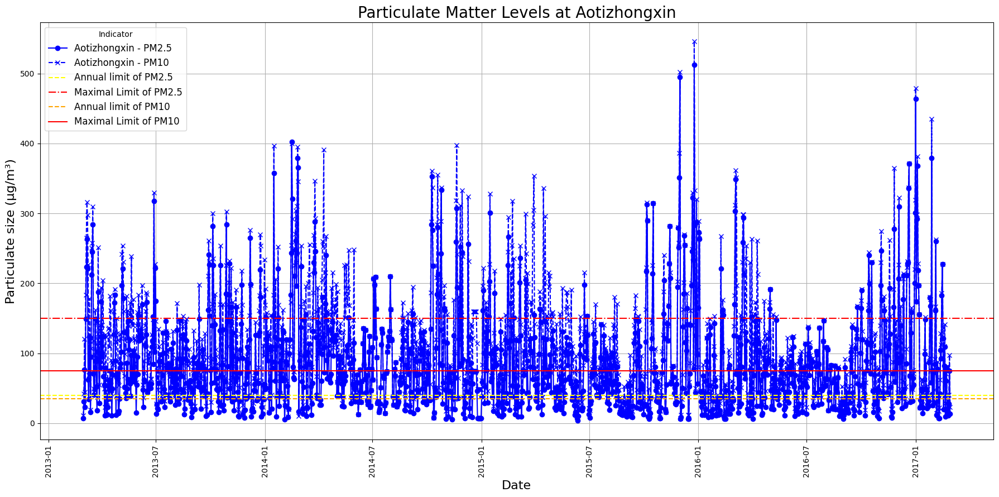

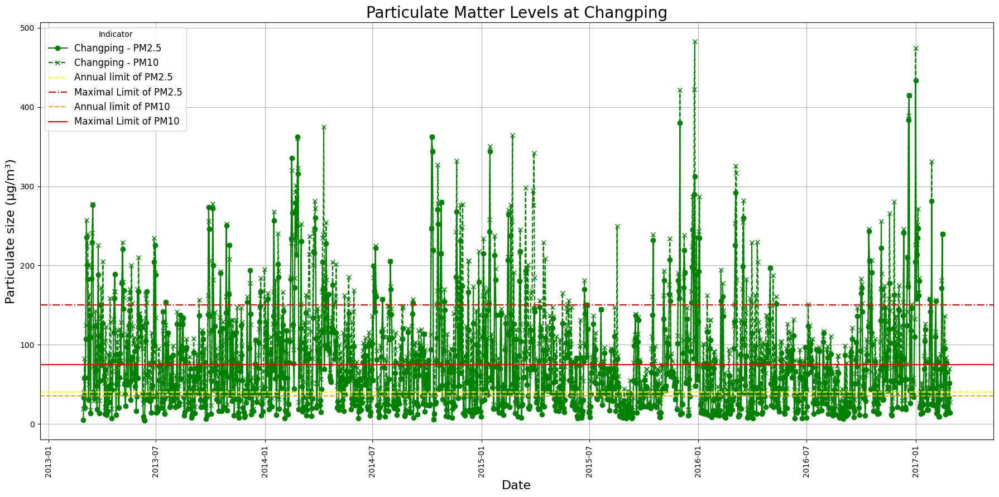

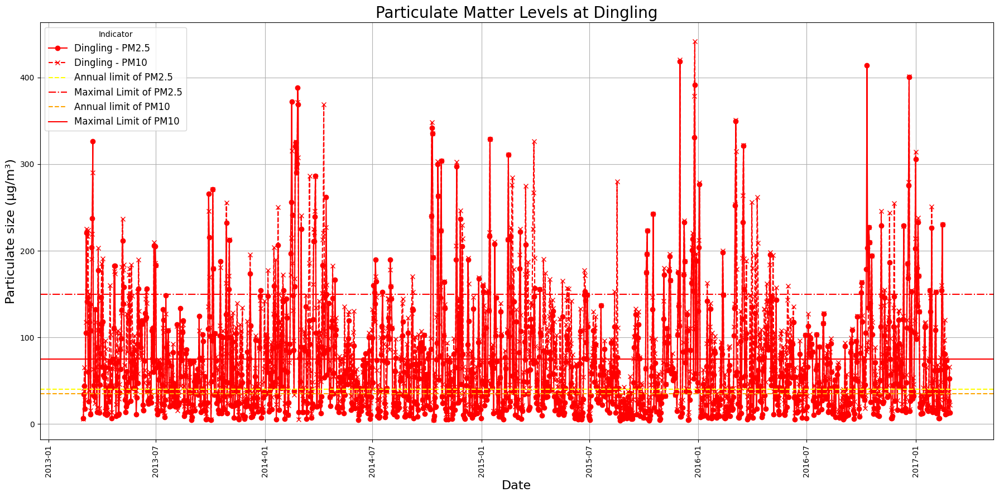

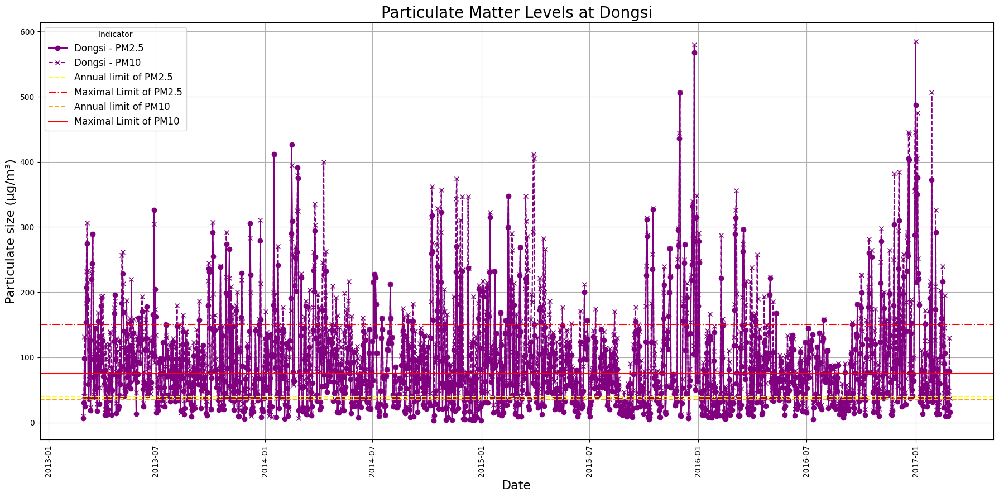

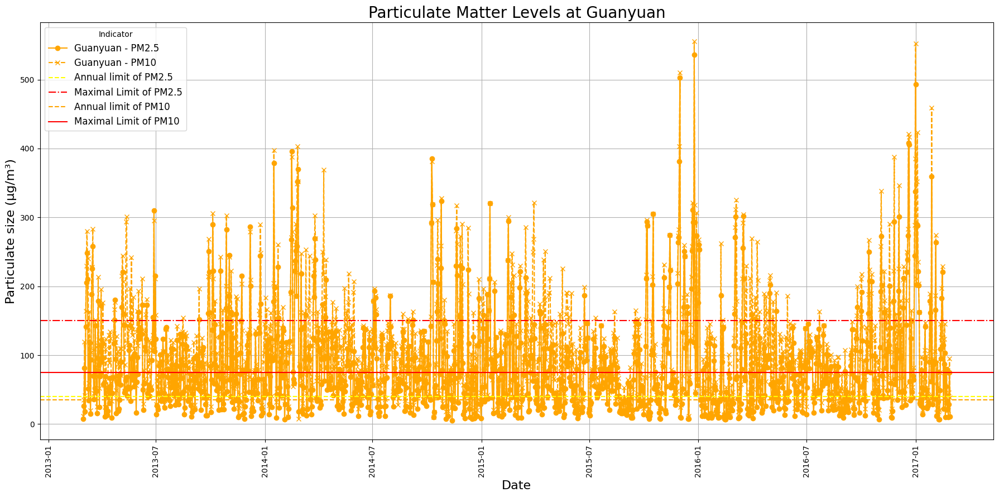

...

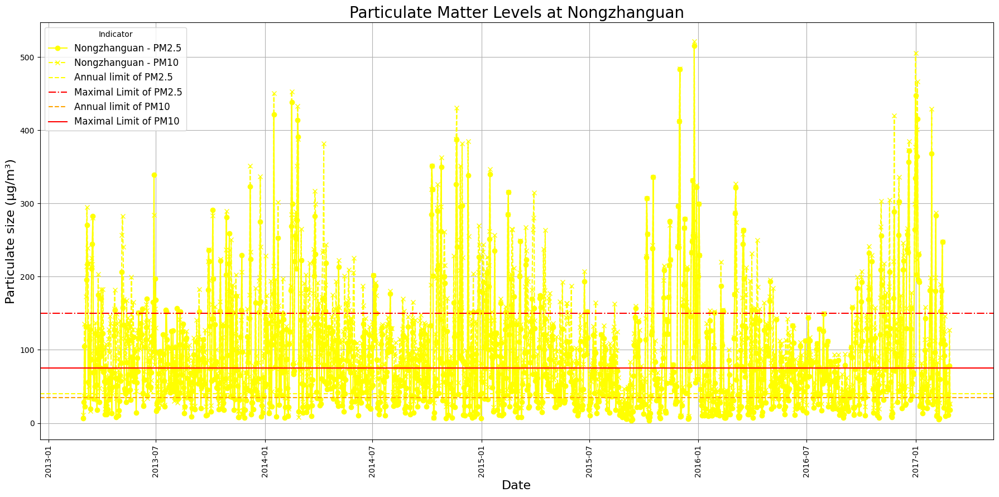

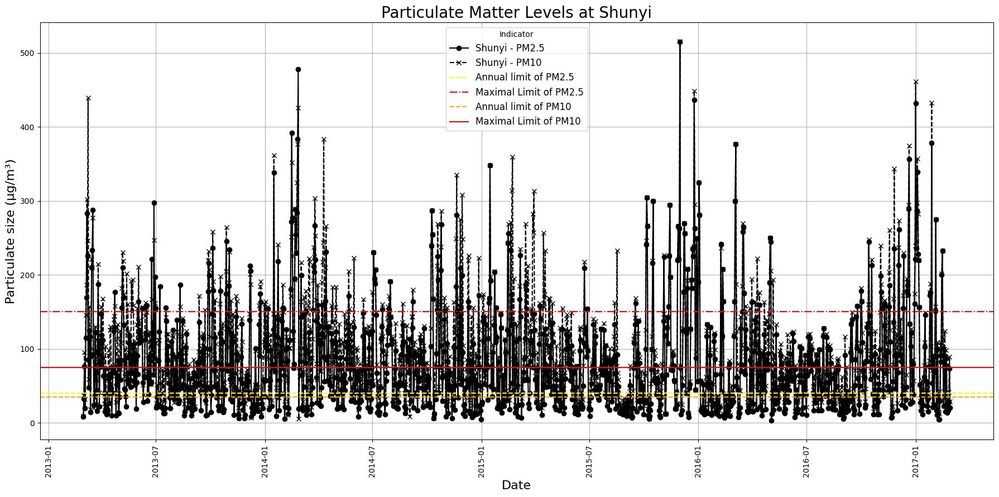

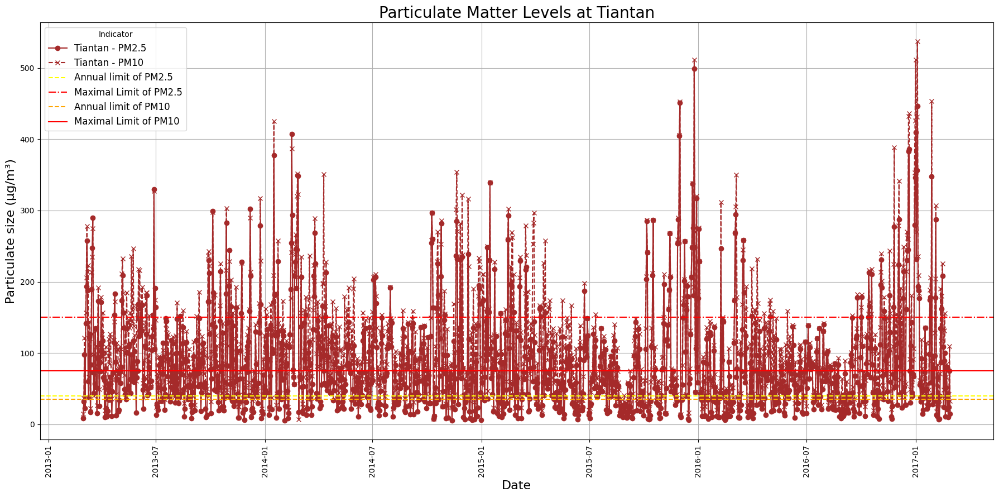

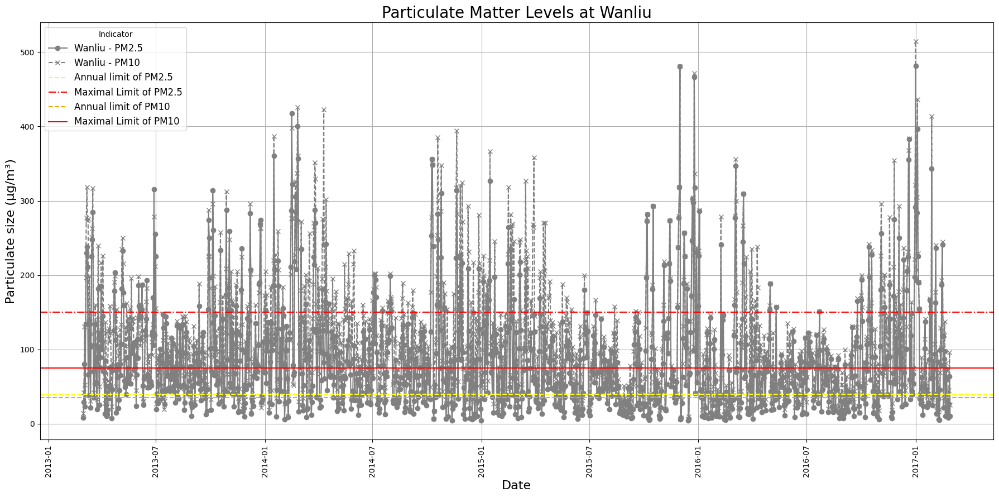

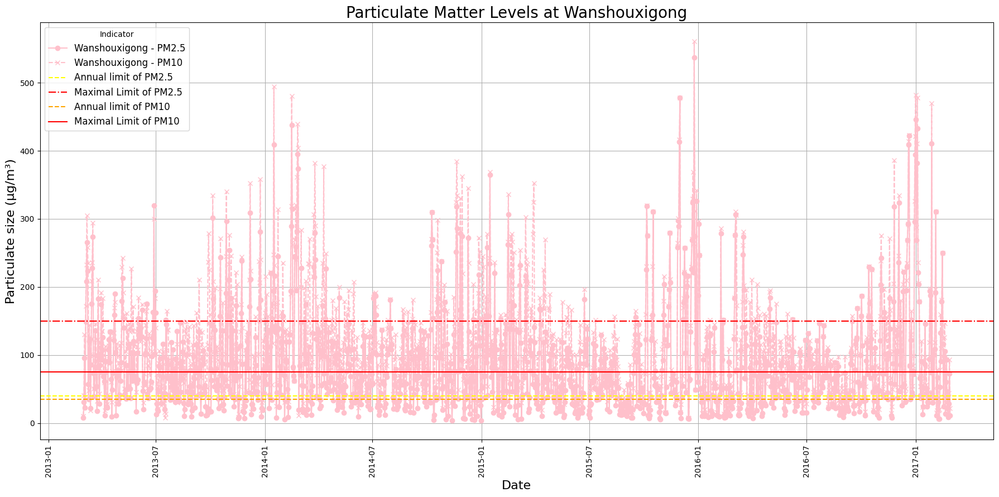

In [128]:
#preparing the graph (looping)
for station, color in zip(stations, colors):
    plot_particulate_data(sbdf, station, color, f"Particulate Matter Levels at {station}")

**Insight:**
- xxx
- xxx

### Question 2: Compound analysis (NO2 and SO2)

In [130]:
#declaring the function (NO2)
def no2_plot(sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    # Plot NO2 for the specified station
    plt.plot(df['date'], df['NO2 value'], marker='o', linestyle='-', label=f'{station} - NO2', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=nitlim['anual'], color='yellow', linestyle='--', label='Annual limit of NO2')
    plt.axhline(y=nitlim['maksimal'], color='red', linestyle='-.', label='Maximal Limit of NO2')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Compound size (µg/m³)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()  # Avoid overlapping
    plt.show()

In [131]:
#declaring the function (SO2)
def so2_plot(sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    # Plot SO2 for the specified station
    plt.plot(df['date'], df['SO2 value'], marker='o', linestyle='-', label=f'{station} - SO2', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=sulplim['daily'], color='yellow', linestyle='--', label='Daily limit of SO2')
    plt.axhline(y=sulplim['hourly'], color='orange', linestyle='--', label='Hourly limit of SO2')
    plt.axhline(y=sulplim['maksimal'], color='red', linestyle='-.', label='Maximal Limit of SO2')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Compound size (µg/m³)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()  # Avoid overlapping
    plt.show()

In [133]:
#color declaration (NO2)
stations = [aotiz, changp, dingl, dongs,guay, guc, hua, non, shuni, tiant, wanli, wansx]
colors = ['blue', 'violet', 'teal', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'black', 'darkred', 'grey', 'pink']
#to graph preparation

In [134]:
#color declaration (SO2)
stations = [aotiz, changp, dingl, dongs,guay, guc, hua, non, shuni, tiant, wanli, wansx]
colors = ['black', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'black', 'brown', 'grey', 'pink']
#to graph preparation

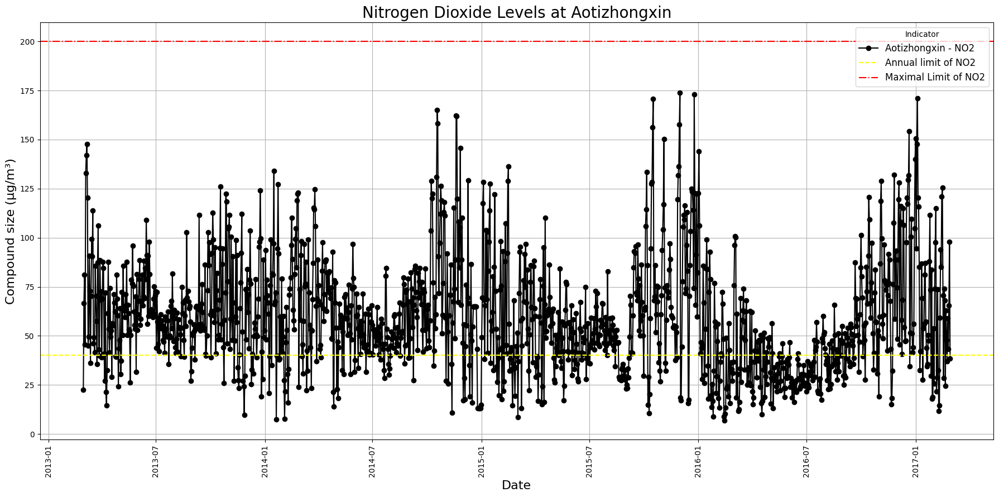

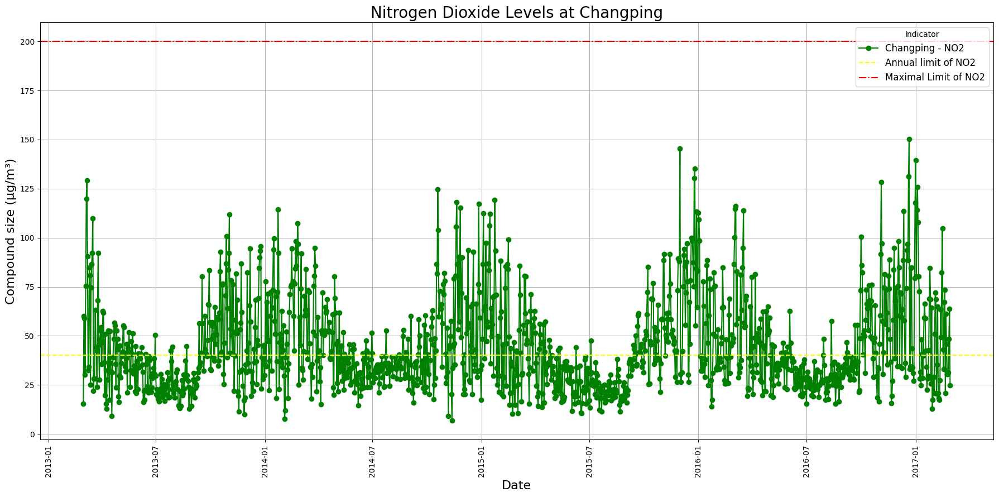

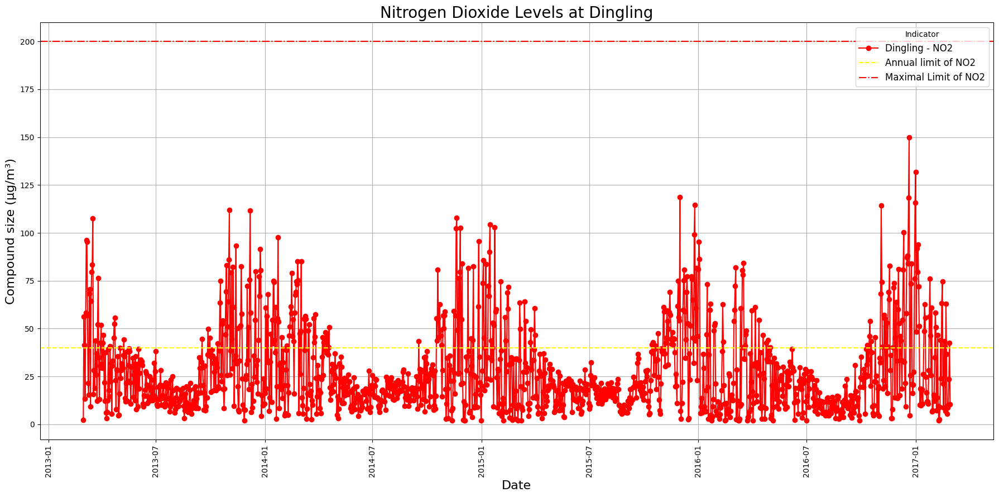

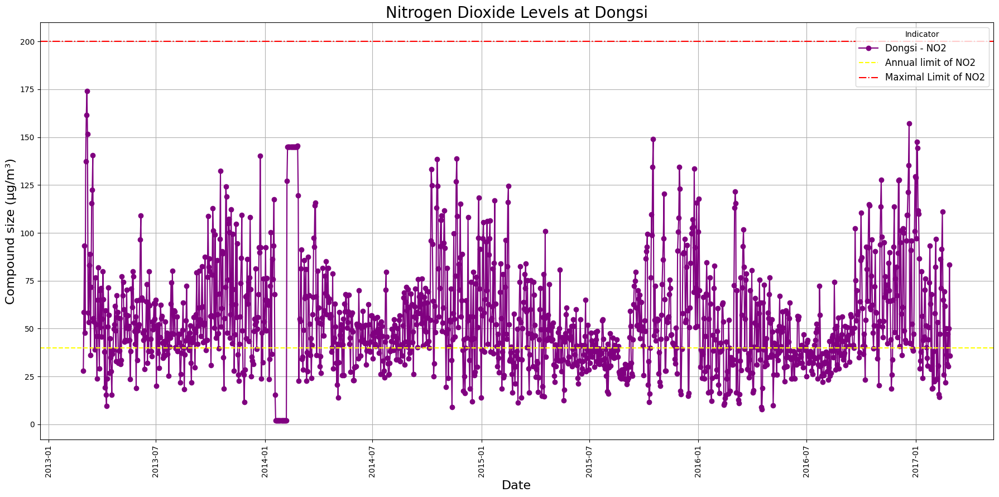

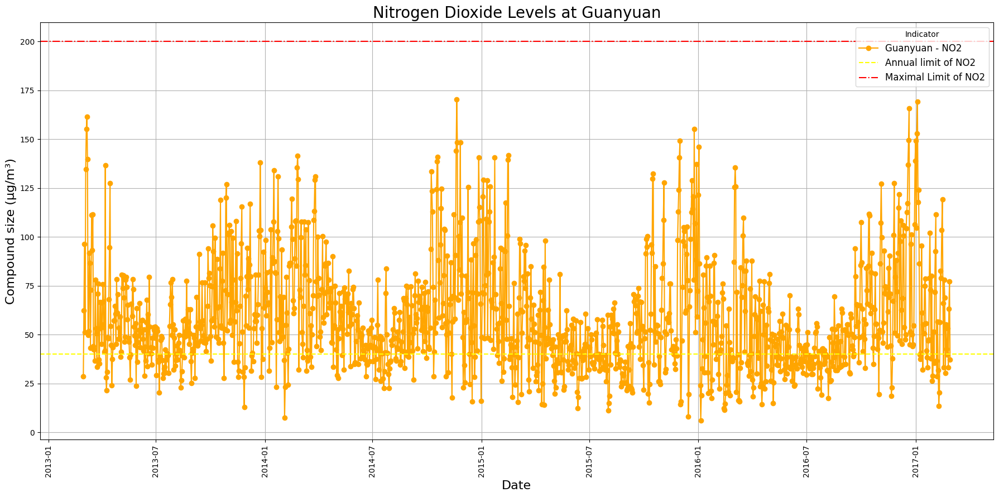

...

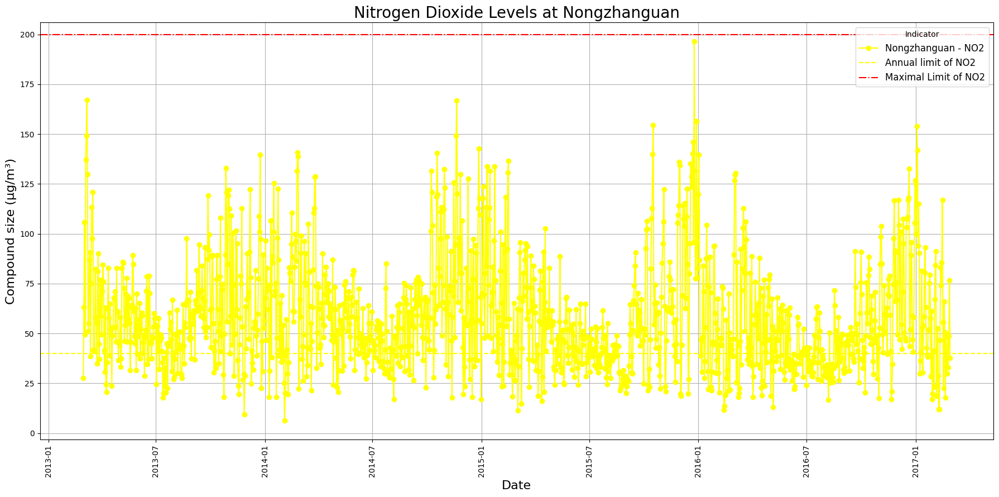

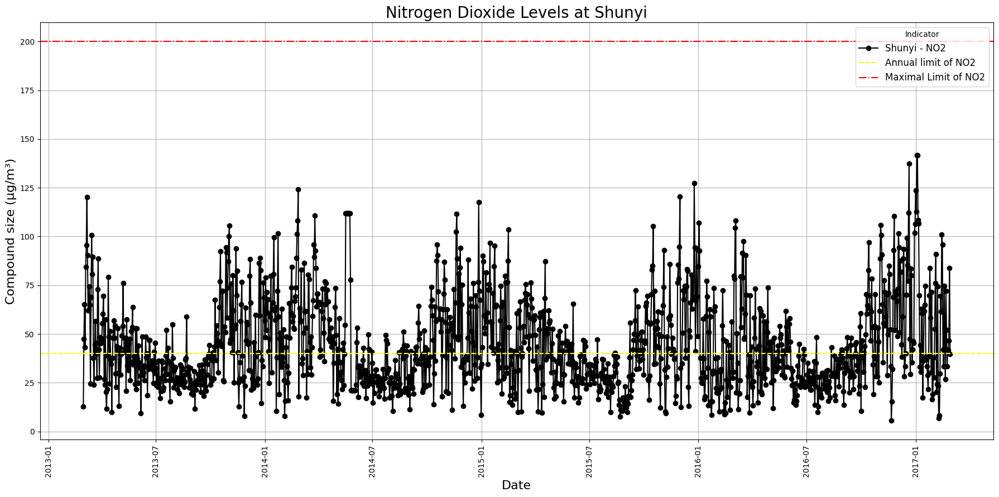

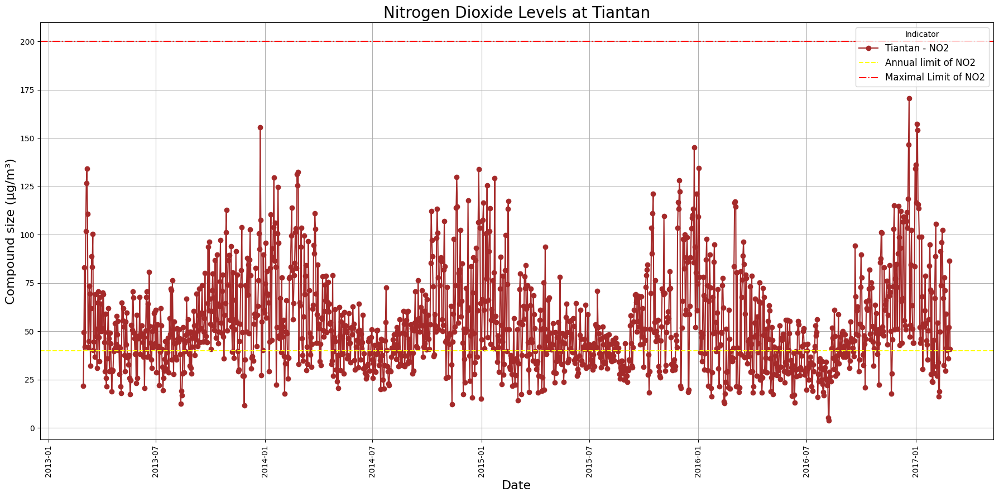

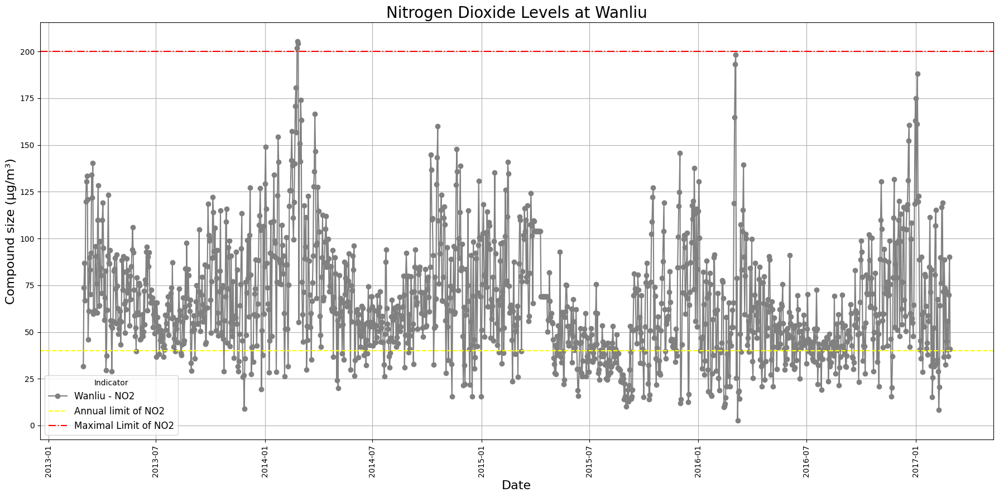

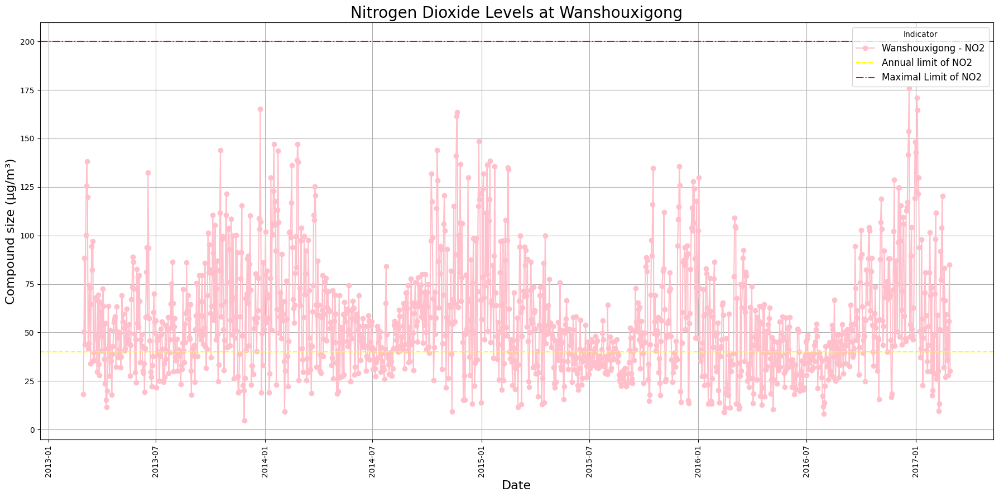

In [135]:
#Geaph execution (NO2)
for station, color in zip(stations, colors):
    no2_plot(sbdf, station, color, f"Nitrogen Dioxide Levels at {station}")

In [ ]:
#ilustrating chart in SO2


**Insight:**
- xxx
- xxx

### Question 3: CO

In [ ]:
#declaring the function
def co_plot(sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    #ploting CO value
    plt.plot(df['date'], df['CO value'], marker='o', linestyle='-', label=f'{station} - CO', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=colim['China'], color='yellow', linestyle='--', label='China Limit of CO')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Compound size (µg/m³)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()

In [ ]:
#chart preparation
stations = [aotiz, changp, dingl, dongs,guay, guc, hua, non, shuni, tiant, wanli, wansx]
colors = ['black', 'green', 'red', 'purple', 'orange', 'cyan', 'magenta', 'yellow', 'black', 'brown', 'grey', 'pink']
#to illustration

In [ ]:
#illustration


### Question 4 : Temperature

In [ ]:
#function to define tempreature
def temp_plot(sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    # Plot Temperature for the specified station
    plt.plot(df['date'], df['TEMP value'], marker='o', linestyle='-', label=f'{station} - TEMP', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=btsuhu['nol'], color='yellow', linestyle='--', label='Below 0')
    plt.axhline(y=btsuhu['dingin'], color='orange', linestyle='--', label='Cold')
    plt.axhline(y=btsuhu['normal'], color='green', linestyle='--', label='Normal')
    plt.axhline(y=btsuhu['panas'], color='red', linestyle='--', label='Hot')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Temperature (Celcius)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()

## Analisis Lanjutan (Opsional)

In [ ]:
#function to inspect air humidity
def humid_plot (sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    # Plot Humidity for the specified station
    plt.plot(df['date'], df['DEWP value'], marker='o', linestyle='-', label=f'{station} - DEWP', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=btlembap['kering'], color='yellow', linestyle='--', label='Dry')
    plt.axhline(y=btlembap['biasa'], color='orange', linestyle='--', label='Common')
    plt.axhline(y=btlembap['lembap'], color='green', linestyle='--', label='Wet')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Humidity (%)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()

In [ ]:
#function to inspect windspeed
def wspd_plot (sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    # Plot wind
    plt.plot(df['date'], df['WSPM value'], marker='o', linestyle='-', label=f'{station} - WSPM', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=lwlsp, color='green', linestyle='--', label='Low')
    plt.axhline(y=mwl, color='yellow', linestyle='--', label='Medium')
    plt.axhline(y=stglim, color='orange', linestyle='--', label='Safely High')
    plt.axhline(y=ghig, color='red', linestyle='--', label='High')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Wind Speed (m/s)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()


In [ ]:
#function to inspect rainfall
def rain_plot (sbdf, station, color, title):
    plt.figure(figsize=(18, 9))
    # Filter the DataFrame for the specified station
    df = sbdf[sbdf['station'] == station]
    # Plot rainfall
    plt.plot(df['date'], df['RAIN value'], marker='o', linestyle='-', label=f'{station} - RAIN', color=color)
    # Batas Keamanan (Assuming these variables are defined elsewhere in your code)
    plt.axhline(y=drl, color='green', linestyle='--', label='Low')
    plt.axhline(y=lrl, color='yellow', linestyle='--', label='Medium')
    plt.axhline(y=mdl, color='orange', linestyle='--', label='High')
    plt.axhline(y=hvrl, color='red', linestyle='--', label='Very High')
    # Chart details
    plt.title(title, fontsize=20)
    plt.xlabel('Date', fontsize=16)
    plt.ylabel('Rainfall (mm)', fontsize=16)
    plt.grid(True)
    plt.legend(title='Indicator', fontsize=12)
    plt.xticks(rotation=90)
    plt.tight_layout()

In [ ]:
#rainfall inspection


## Conclusion

- Conclution pertanyaan 1
- Conclution pertanyaan 2